In [1]:
import os
import cv2
import torch
import numpy as np
import torch.nn as nn
import PIL.Image as Image
import torch.optim as optim
import matplotlib.pyplot as plt
from google.colab import drive 
from torchvision import transforms, models

In [2]:
torch.__version__

'1.5.1+cu101'

In [3]:
!nvidia-smi

Sun Jun 28 14:21:05 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.36.06    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   60C    P8    30W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
IMAGES = '/content/drive/My Drive/Images'

In [7]:
vgg = models.vgg19(pretrained=True).features

for param in vgg.parameters():
  param.requires_grad_(False)

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [8]:
def load_img(img_path, img_size = 512, shape = None):
  img = Image.open(img_path).convert('RGB')

  if max(img.size) < img_size:
    img_size = max(img.size)
  
  if shape is not None:
    img_size = shape

  transform = transforms.Compose([transforms.Resize(img_size),
                                  transforms.ToTensor(),
                                  transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])
  
  return transform(img).unsqueeze(0)

In [9]:
def np_convert(tensor):
  img = tensor.cpu().clone().detach().numpy()
  
  img = img.squeeze()
  
  img = img.transpose(1, 2, 0)
  
  img = img * np.array((0.5, 0.5, 0.5)) + np.array((0.5, 0.5, 0.5))
  
  return img.clip(0, 1)

In [10]:
def get_features(img, model):
  layers = {'0': 'conv1_1', '5': 'conv2_1', '10': 'conv3_1', '19': 'conv4_1', '21': 'conv4_2', '28': 'conv5_1'}
  
  features = {}

  for name, layer in model._modules.items():
    img = layer(img)
    
    if name in layers:
      features[layers[name]] = img
    
  return features

In [11]:
def gram_matrix(tensor):
  _, c, h, w = tensor.size()

  tensor = tensor.view(c, h*w)

  gram= torch.mm(tensor, tensor.t())

  return gram

In [12]:
content = load_img(os.path.join(IMAGES, 'shrek_PNG3.png'), shape=(512, 512)).to(device)
style = load_img(os.path.join(IMAGES, 'spaghetti.jpg'), shape=(512, 512)).to(device)

(-0.5, 511.5, 511.5, -0.5)

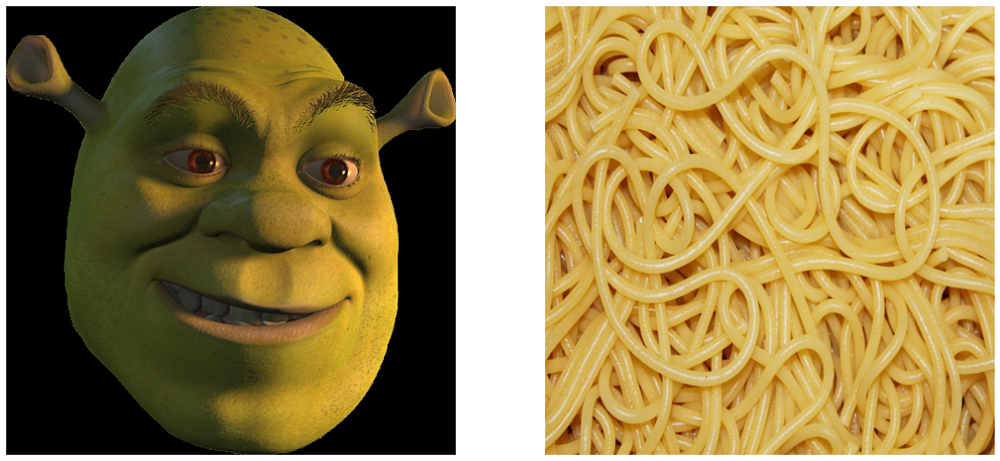

In [13]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.imshow(np_convert(content))
ax1.axis('off')

ax2.imshow(np_convert(style))
ax2.axis('off')

In [14]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [15]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

In [16]:
style_weights = {'conv1_1': 1.0, 'conv2_1': 0.75, 'conv3_1': 0.2, 'conv4_1': 0.2, 'conv5_1': 0.2}

content_weight = 1
style_weight = 1e6 

In [17]:
target = content.clone().requires_grad_(True).to(device)

In [18]:
verbose = 300
optimizer = optim.Adam([target], lr=0.003)
num_steps = 12000

height, width, channels = np_convert(target).shape
img_array = np.empty(shape=(300, height, width, channels))
cap_frame = num_steps/300

ctr = 0

Step 300, Total Loss: 6641319.5


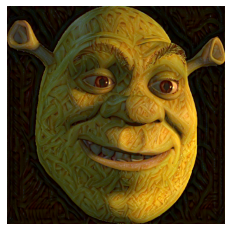

Step 600, Total Loss: 4531271.0


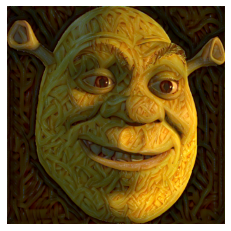

Step 900, Total Loss: 3427019.0


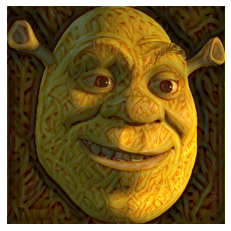

Step 1200, Total Loss: 2660291.0


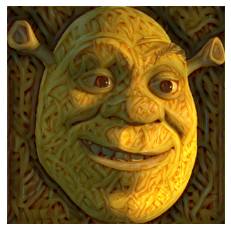

Step 1500, Total Loss: 2072376.875


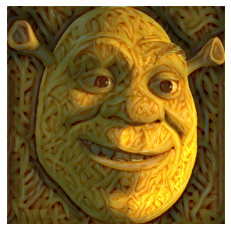

Step 1800, Total Loss: 1602816.875


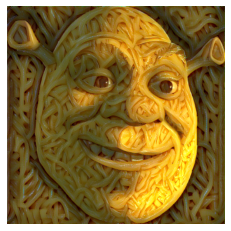

Step 2100, Total Loss: 1225498.75


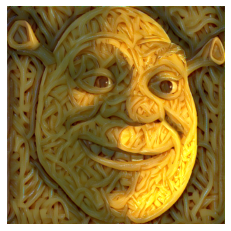

Step 2400, Total Loss: 926912.0625


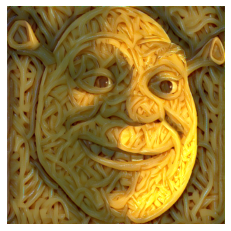

Step 2700, Total Loss: 694710.0625


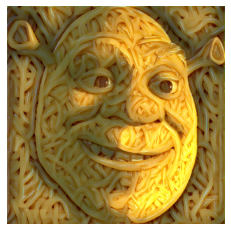

Step 3000, Total Loss: 515531.78125


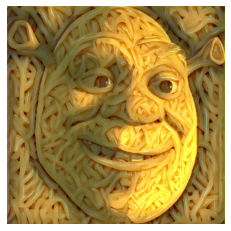

Step 3300, Total Loss: 377063.1875


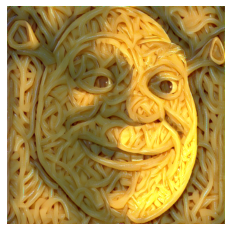

Step 3600, Total Loss: 275781.59375


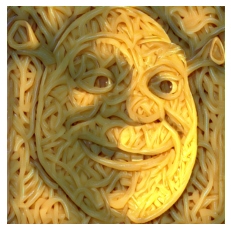

Step 3900, Total Loss: 201820.921875


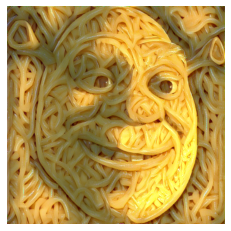

Step 4200, Total Loss: 149963.328125


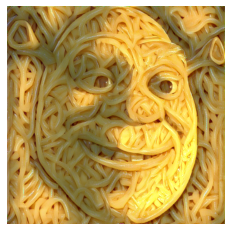

Step 4500, Total Loss: 113862.359375


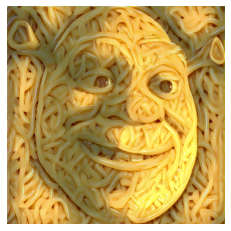

Step 4800, Total Loss: 89666.140625


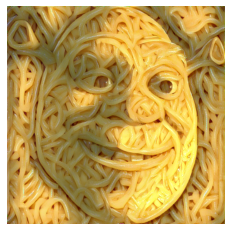

Step 5100, Total Loss: 71598.34375


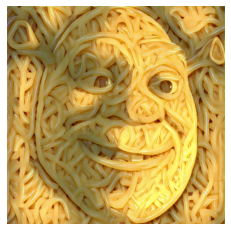

Step 5400, Total Loss: 59238.44140625


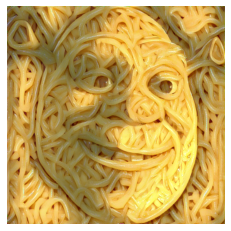

Step 5700, Total Loss: 49949.27734375


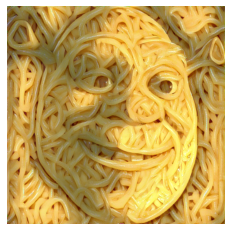

Step 6000, Total Loss: 44161.125


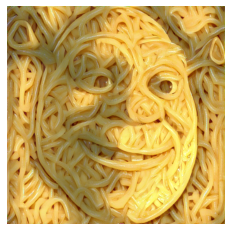

Step 6300, Total Loss: 39010.54296875


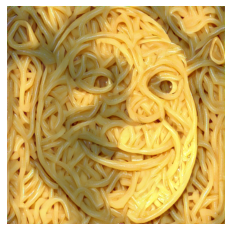

Step 6600, Total Loss: 35402.578125


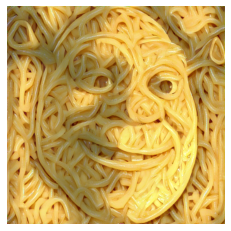

Step 6900, Total Loss: 32995.30859375


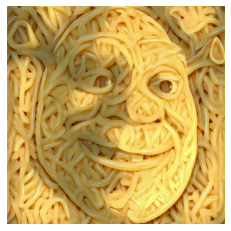

Step 7200, Total Loss: 30203.392578125


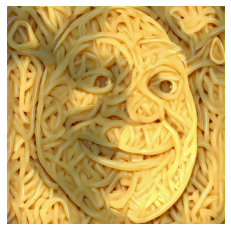

Step 7500, Total Loss: 28316.90234375


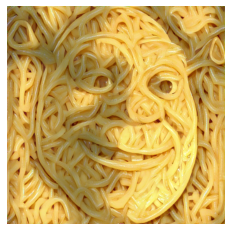

Step 7800, Total Loss: 27985.26953125


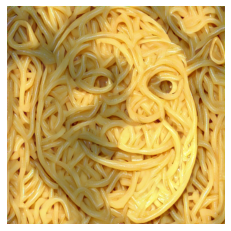

Step 8100, Total Loss: 26106.3125


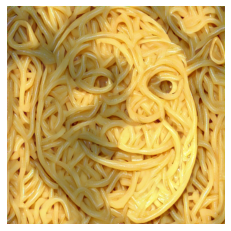

Step 8400, Total Loss: 25069.328125


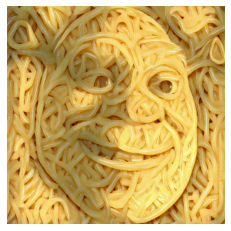

Step 8700, Total Loss: 25093.796875


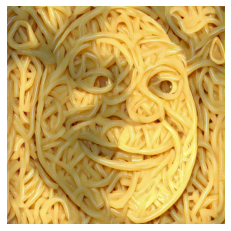

Step 9000, Total Loss: 23350.376953125


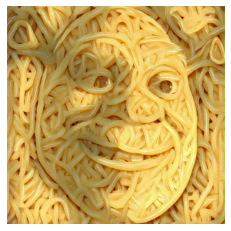

Step 9300, Total Loss: 22471.15234375


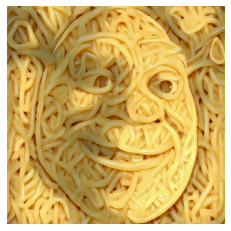

Step 9600, Total Loss: 22403.650390625


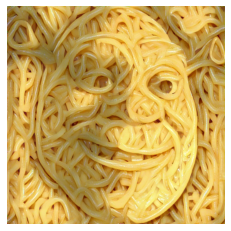

Step 9900, Total Loss: 22014.400390625


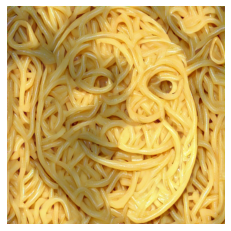

Step 10200, Total Loss: 20955.3515625


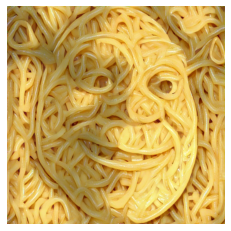

Step 10500, Total Loss: 21115.396484375


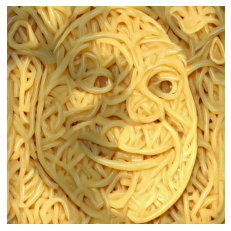

Step 10800, Total Loss: 20163.8203125


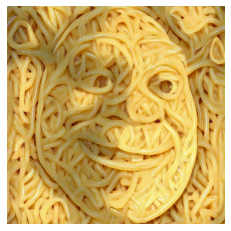

Step 11100, Total Loss: 19673.841796875


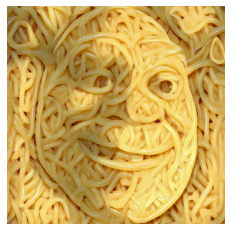

Step 11400, Total Loss: 19492.591796875


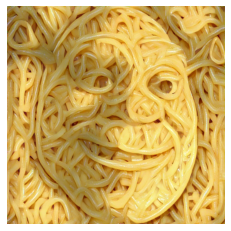

Step 11700, Total Loss: 18960.70703125


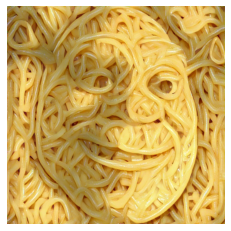

Step 12000, Total Loss: 18698.3984375


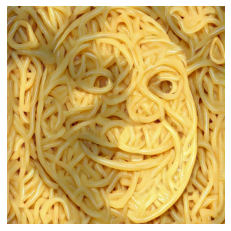

In [19]:
for i in range(1, num_steps+1):
  target_features = get_features(target, vgg)
  
  content_loss = torch.mean(torch.square(target_features['conv4_2'] - content_features['conv4_2']))
  
  style_loss = 0.0
  
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gm = gram_matrix(target_feature)
    style_gm = style_grams[layer]
    layer_style_loss = style_weights[layer] * torch.mean(torch.square(target_gm - style_gm))
    _, d, h, w = target_feature.shape
    style_loss += layer_style_loss / (d * h * w)
  
  total_loss = content_loss * content_weight + style_loss * style_weight

  optimizer.zero_grad()
  total_loss.backward()
  optimizer.step()

  if i % verbose == 0:
    print(f'Step {i}, Total Loss: {total_loss.item()}')

    plt.imshow(np_convert(target))
    plt.axis('off')
    plt.show()
  
  if i % cap_frame == 0:
    img_array[ctr] = np_convert(target)
    ctr += 1

(-0.5, 511.5, 511.5, -0.5)

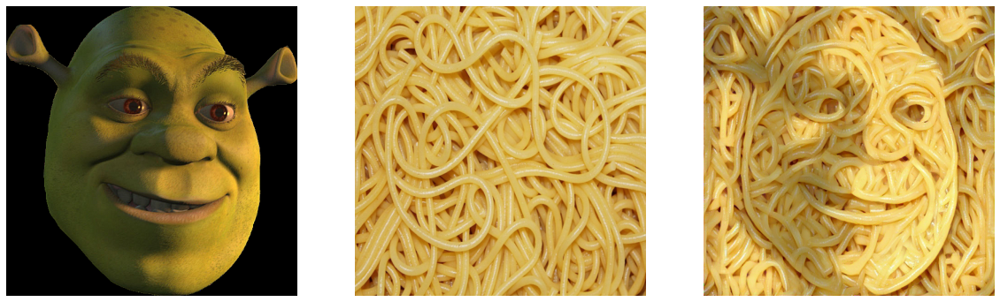

In [20]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))

ax1.imshow(np_convert(content))
ax1.axis('off')

ax2.imshow(np_convert(style))
ax2.axis('off')

ax3.imshow(np_convert(target))
ax3.axis('off')

In [21]:
frame_height, frame_width, _ = np_convert(target).shape
writer = cv2.VideoWriter(os.path.join(IMAGES, 'shrek_spaghetti_output.mp4'), cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width, frame_height))

for i in range(0, 300):
  img = img_array[i] * 255
  img = img.astype(np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  writer.write(img)

writer.release()

In [22]:
content = load_img(os.path.join(IMAGES, 'City.jpg'), shape=(512, 512)).to(device)
style = load_img(os.path.join(IMAGES, 'StarryNight.jpg'), shape=(512, 512)).to(device)

(-0.5, 511.5, 511.5, -0.5)

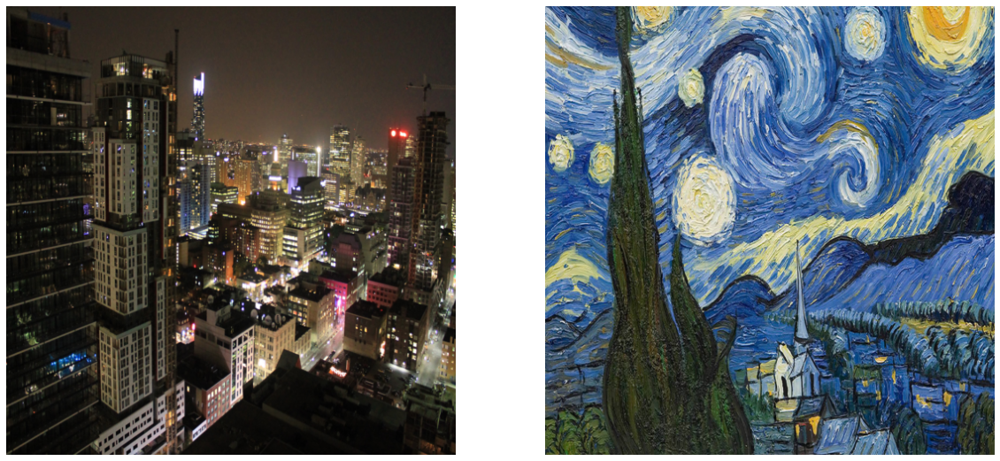

In [23]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

ax1.imshow(np_convert(content))
ax1.axis('off')

ax2.imshow(np_convert(style))
ax2.axis('off')

In [24]:
content_features = get_features(content, vgg)
style_features = get_features(style, vgg)

In [25]:
style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

In [26]:
style_weights = {'conv1_1': 1.0, 'conv2_1': 0.75, 'conv3_1': 0.2, 'conv4_1': 0.2, 'conv5_1': 0.2}

content_weight = 1
style_weight = 1e6

In [27]:
target = content.clone().requires_grad_(True).to(device)

In [28]:
verbose = 300
optimizer = optim.Adam([target], lr=0.003)
num_steps = 6000

height, width, channels = np_convert(target).shape
img_array = np.empty(shape=(300, height, width, channels))
cap_frame = num_steps/300

ctr = 0

Step 300, Total Loss: 3109228.75


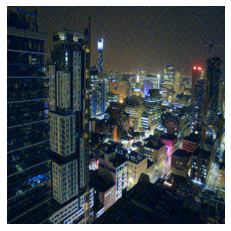

Step 600, Total Loss: 1028168.875


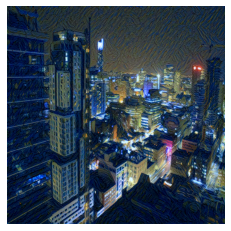

Step 900, Total Loss: 716454.25


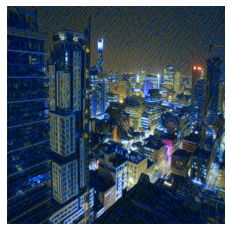

Step 1200, Total Loss: 554965.1875


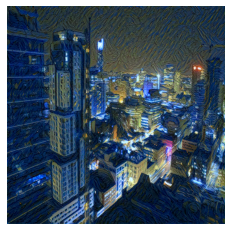

Step 1500, Total Loss: 434671.0625


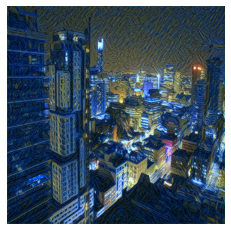

Step 1800, Total Loss: 340545.59375


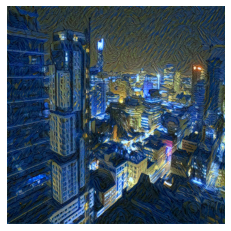

Step 2100, Total Loss: 265782.375


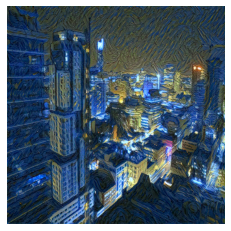

Step 2400, Total Loss: 206326.265625


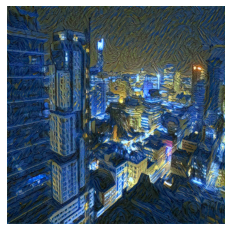

Step 2700, Total Loss: 159086.296875


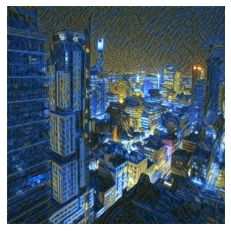

Step 3000, Total Loss: 121855.234375


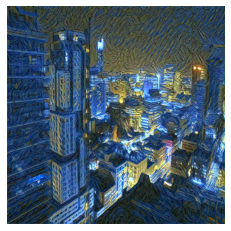

Step 3300, Total Loss: 92981.390625


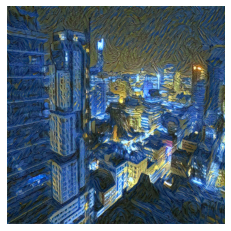

Step 3600, Total Loss: 70973.5


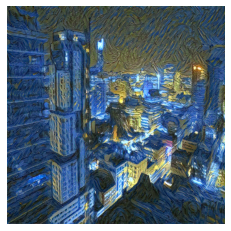

Step 3900, Total Loss: 54528.0546875


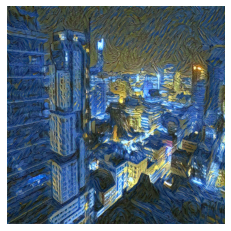

Step 4200, Total Loss: 42489.8203125


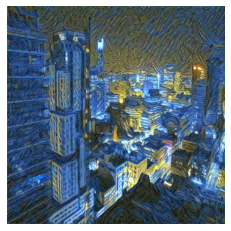

Step 4500, Total Loss: 33809.83984375


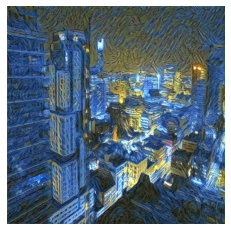

Step 4800, Total Loss: 27627.0078125


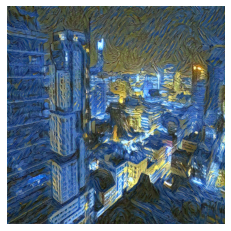

Step 5100, Total Loss: 23191.98828125


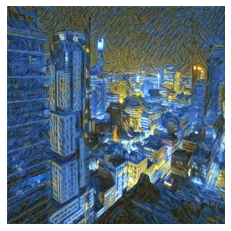

Step 5400, Total Loss: 20015.212890625


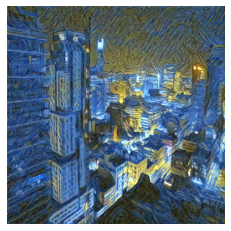

Step 5700, Total Loss: 17647.7109375


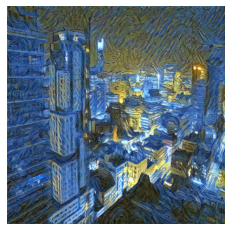

Step 6000, Total Loss: 16027.2158203125


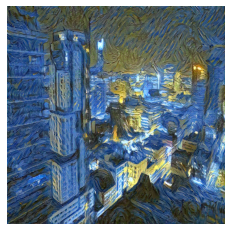

In [29]:
for i in range(1, num_steps+1):
  target_features = get_features(target, vgg)
  
  content_loss = torch.mean(torch.square(target_features['conv4_2'] - content_features['conv4_2']))
  
  style_loss = 0.0
  
  for layer in style_weights:
    target_feature = target_features[layer]
    target_gm = gram_matrix(target_feature)
    style_gm = style_grams[layer]
    layer_style_loss = style_weights[layer] * torch.mean(torch.square(target_gm - style_gm))
    _, d, h, w = target_feature.shape
    style_loss += layer_style_loss / (d * h * w)
  
  total_loss = content_loss * content_weight + style_loss * style_weight

  optimizer.zero_grad()
  total_loss.backward()
  optimizer.step()

  if i % verbose == 0:
    print(f'Step {i}, Total Loss: {total_loss.item()}')

    plt.imshow(np_convert(target))
    plt.axis('off')
    plt.show()
  
  if i % cap_frame == 0:
    img_array[ctr] = np_convert(target)
    ctr += 1

(-0.5, 511.5, 511.5, -0.5)

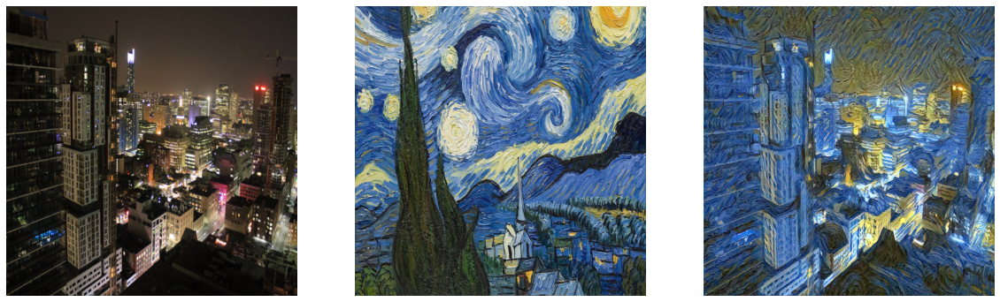

In [30]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 10))

ax1.imshow(np_convert(content))
ax1.axis('off')

ax2.imshow(np_convert(style))
ax2.axis('off')

ax3.imshow(np_convert(target))
ax3.axis('off')

In [31]:
frame_height, frame_width, _ = np_convert(target).shape
writer = cv2.VideoWriter(os.path.join(IMAGES, 'starry_city_output.mp4'), cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width, frame_height))

for i in range(0, 300):
  img = img_array[i] * 255
  img = img.astype(np.uint8)
  img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
  writer.write(img)

writer.release()